$$ Galaxy\:Merger\:Project $$
   $$ Jessica\:Pilgram $$
   $$ Phys\:202-2015 $$

The way in which galaxies form and interact is currently a dominate research topic in the field of astrophysics. The goal of this project is to simulate galaxy interactions as they pass and/or merge with eachother. I will be using the approach done by Toomre and Toomre, in which massless point particles are orbiting a massive galactic nucleus $M$ that has another massive galactic nulci $S$ in a parabolic orbit around it. In the Toomre paper they did several different types of simulations by varying the way in which $S$ passed $M$. I will be focusing on direct and retrograde passages. A direct passage by $S$ is when it passes $M$ in the same direction as the massless particles orbit $M$. A retrograde passage is when $S$ passes $M$ opposite of the direction that the massless particles orbit $M$. The thoretical and sought behavior in the system simulations is that of spiral galaxy arms. 

###Imports

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint
from IPython.html.widgets import interact, fixed
from moviepy.video.io.bindings import mplfig_to_npimage
import moviepy.editor as mpy
from IPython.display import Image

from plots import plot_pos, plot_pos_cm, sub_retro, sub_direct
from initial_conditions import star, star_cond, S_cond, S_condd
from solve_system import derivs, solve_system, get_sol, get_sol_direct

:0: FutureWarning: IPython widgets are experimental and may change in the future.
  warn(skimage_deprecation('The `skimage.filter` module has been renamed '



###The Differential Equations

$$ \ddot{\mathbf{r}} = -\gamma \left\{ \frac{M}{r^3}\mathbf{r} -\frac{S}{\rho^3}\boldsymbol{\rho} + \frac{S}{R^3}\boldsymbol\Re \right\} $$

$$ \ddot{\boldsymbol\Re} = -\gamma \frac{M+S}{R^3}\boldsymbol\Re$$

where 

* $\gamma$ is the Gravitational constant.
* $M$ is the central mass of the main galaxy and $S$ is the central mass of the disrupting galaxy
* $\mathbf{r}$ is the radius vector from mass $M$ to massless point particle $m$, representing a single (massless) star in the outer disk of the main galaxy.
* $\boldsymbol\Re$ is the radius vector from $M$ to $S$
* $\boldsymbol{\rho} = \boldsymbol{\Re} - \boldsymbol{r}$

###Solivng the Differential Equations

In [24]:
def derivs(rvec, t, M, S):
    """Computes the derivs for the 3 body system at rvec(t)
    
    Parameters
    ----------
    rvec: np.array, solution vector
    M, S: float, central mass of respective galaxies
    t: array, times at which want derivatives
    
    Returns
    -------
    vector: the derivatives of function
    """
    
    rx = rvec[0]
    ry = rvec[2]
    rdx = rvec[1]
    rdy = rvec[3]
    
    Rx = rvec[4]
    Ry = rvec[6]
    Rdx = rvec[5]
    Rdy = rvec[7]
    
    rhox = Rx - rx
    rhoy = Ry - ry
    
    R_mag= np.sqrt(Rx**2 + Ry**2)
    r_mag = np.sqrt(rx**2 + ry**2)
    rho_mag = np.sqrt(rhox**2 + rhoy**2)
    
    G = 4.498e-6
    
    rdx2 = -G*((M/r_mag**3)*rx - rhox*(S/rho_mag**3)  + Rx*(S/R_mag**3))
    rdy2 = -G*((M/r_mag**3)*ry - rhoy*(S/rho_mag**3)  + Ry*(S/R_mag**3))
    
    Rdx2 = -G*(Rx*((M+S)/R_mag**3))
    Rdy2 = -G*(Ry*((M+S)/R_mag**3))
    
    return np.array([rdx, rdx2, rdy, rdy2, Rdx, Rdx2, Rdy, Rdy2])

Based on the way I wrote my derivs funciton, the solved system it will return the solution as an array in the from of: 

$r(x,y) = (x_1, dx_1, y_1, dy_1, x_2, dx_2, y_2, dy_2)$

In [25]:
def solve_system(ic, t, M, S):
    """Computes solution of 3 Body Problem for single initial condition ic
    
    Parameters
    ----------
    ic: array or list, initial conditions of system
    t: array, array of times for which the system will be solved
    M, S: float, central mass of respective galaxies
    
    Returns
    -------
    returns array of the solution vectors of the differential equation
    """
    
    return odeint(derivs, ic, t, args=(M, S), atol=1e-4, rtol=1e-5)

##Initial Conditions
These three body systems are extremely sensitive to the initial conditions that they are given.
Some of these initial conditions were given in the Toomre and Toomre paper:
* Max radius of stars = 15 kpc
* Min radius of S = 25 kpc
* Mass M = 1e11 $M_o$
* Mass S = 1e11 $M_o$
* Time: $10^8$ $\frac{years}{time unit}$

The others need to calculated. In order to achieve a realistic and correctly working model, I need to calcuate the initial velocity conditions for all all variations of the system using orbital mechanics.
 
####Parabolic Orbit Velocity
This is used for the velocity of disrupting galaxy $S$
\begin{equation*}
v = \sqrt{\frac{2\mu}{r}}
\end{equation*}

####Circular Orbit Velocity
This is used for the velocities of all stars
\begin{equation*}
v = \sqrt{\frac{\mu}{r}}
\end{equation*}

where 
* $a$ is the semi-major axis
* $\mu$ is the standard gravitational parameter $\gamma (M+m)$
* $r$ is the radius of the orbit
* $\gamma$ is the gravitaional constant $4.498*10^{-6}$ $\frac{kpc^3}{M_o*years^2}$

In [26]:
def star(r, M, theta):
    """Computes the inital conditions of a single star
    
    Parameters
    ----------
    r: float, radius of star
    M: float, Mass of M
    theta: float, angle from +x axis at which star intially starts
    
    Returns
    -------
    returns a list of the initial conditions for a single star
    """
    
    G = 4.498e-6
    
    x = r*np.cos(theta)
    y = r*np.sin(theta)
    
    v = np.sqrt((G*M)/np.sqrt(x**2+y**2))
    
    vx = -v*np.sin(theta)
    vy = v*np.cos(theta)
    
    return [x,vx,y,vy]

In [27]:
def star_cond(N, M, r):
    """Creates initial conditions for number of stars you want in inner layer
    
    Parameters
    ----------
    N: int, number of stars wanted in shell
    M: float, mass of M
    r: radius at which you want the stars
    
    Returns
    -------
    returns array consisting of the inital conditions for each star
    """
    theta = np.linspace(0,2*np.pi,N)
    cond = np.array([star(r, M, theta[i]) for i in range(N)])
    return cond

In [28]:
def S_cond(R,y, M, S):
    """Computes the initial conditions for galactic nucli S
    
    Parameters
    ----------
    R: float, minimum distance between S and M
    y, float, starting y position for S
    M,S: float, mass of the respective galactic centers
    
    Returns
    -------
    x starting postion, x velocity, y startig position, y velocity
    """
    G = 4.498e-6
    x = -y**2/(4*R) + R
    theta = np.arctan(50/y)
    
    v = np.sqrt(2*(G*(M+S))/np.sqrt(x**2+y**2))
    vx = v*np.cos(theta)
    vy = -v*np.sin(theta)
    
    return x, vx, y, vy

All initial conditions for my simulations are calculated using either the three above functions or slight variations of these functions.

###Solving the System

Using this function I can solve the system for a retrograde passage of the galaxies. A slight variation of the function in which the initial velocities of $S$ are reversed, allows me to solve the system for a direct passages of the Galaxies. 

In [29]:
def get_sol(rS, t, M, S, N):
    """Solves the system for N number of stars
    
    Parameters
    ----------
    rS: float, minimum radius of S
    t: array, array of times
    M: float, mass of M
    S: float, mass of S
    N: int, number of stars wanted in inner layer,
        each consecutive layer will have 6 additional stars
    
    Returns
    -------
    Returns the solution as postitions for each star and S at all times for retrograde passage
    """
    G = 4.498e-6

    sx,svx,sy,svy = S_cond(rS,50, M, S)

    radi = np.array([0.2*rS,0.3*rS,0.4*rS,0.5*rS,0.6*rS])
    k=N+1
    star_sols = []
    for r in radi:
        c = star_cond(k,M,r)
        for i in range(k):
            ic = c[i]
            ic = np.append(ic, np.array([sx, svx, sy, svy]))
            sol = solve_system(ic, t, M, S)

            x = sol[:,0]
            y = sol[:,2]
            X = sol[:,4]
            Y = sol[:,6]
            star_sols.append(x)
            star_sols.append(y)
        k+=6
    
    all_stars = np.transpose(np.vstack(star_sols))
    starx = all_stars[:,0::2]
    stary = all_stars[:,1::2]
        
    return starx, stary, X, Y

Once I have the solution of the system, I can plot the system at any time I choose.

In [30]:
def plot_pos(rx, ry, sx, sy, j=0):
    """Plots the solved positions of the system at any time
    
    Parameters
    ----------
    rx: array, x postitions of all stars
    ry: array, y postitions of all stars
    sx: array, x postitions of S
    sy: array, y postitions of S
    j: float, time at which you are plotting
    
    Returns
    -------
    Scatter plot of the system at any given time.
    """
    
    plt.figure(figsize=(6,6))
    
    plt.scatter(0,0,color= 'b', label= 'M')
    plt.scatter(sx[j], sy[j], color = 'r', label = 'S')
    plt.scatter(rx[j], ry[j], color = 'g', label = 'stars', s=6)
        
    plt.legend(loc='upper left')
    plt.xlim(-65,65)
    plt.ylim(-65,65)
    plt.box(False)
    plt.tick_params(axis = 'x', top = 'off', bottom = "off", labelbottom= 'off')
    plt.tick_params(axis = 'y', right = 'off', left= "off", labelleft= 'off')
    plt.show()

#####By comparing static plots of my simulation to static plots of the Toomre simulations I can varify that my code is working correctly.

In [31]:
##Defining some intial conditions
M = 1e11
S = 1e11
rS = 25
N = 12 #this will result in 120 stars
t = np.linspace(0,1,400)

###Retrograde Passage

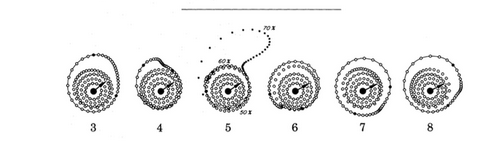

In [32]:
Image(filename='Toomre_retro4project.PNG')

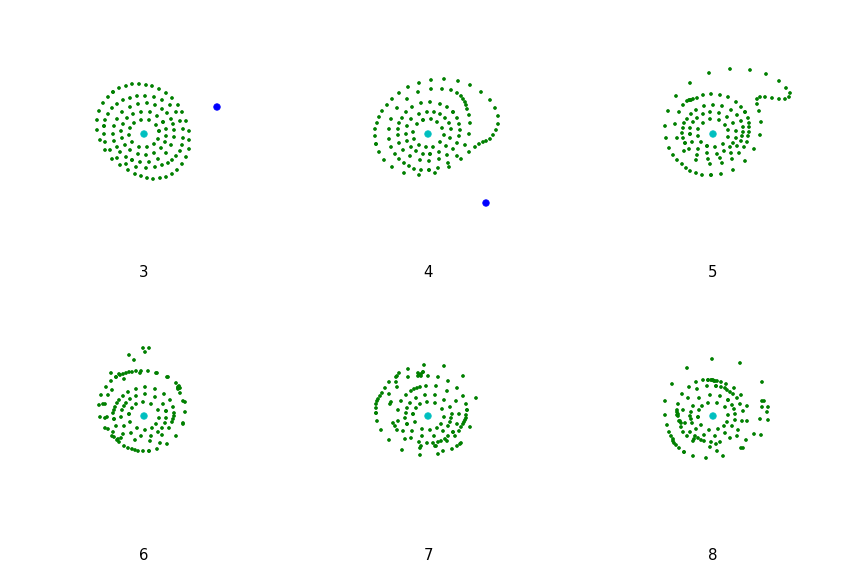

In [33]:
times = np.array([[85, 139, 197], [314, 356, 399]])
rx, ry, sx, sy = get_sol(rS, t, M, S, N)
sub_retro(rx, ry, sx, sy, times)

In [34]:
m = mpy.VideoFileClip('base_retro.mp4')
m.ipython_display(fps=24)

##Direct Passage

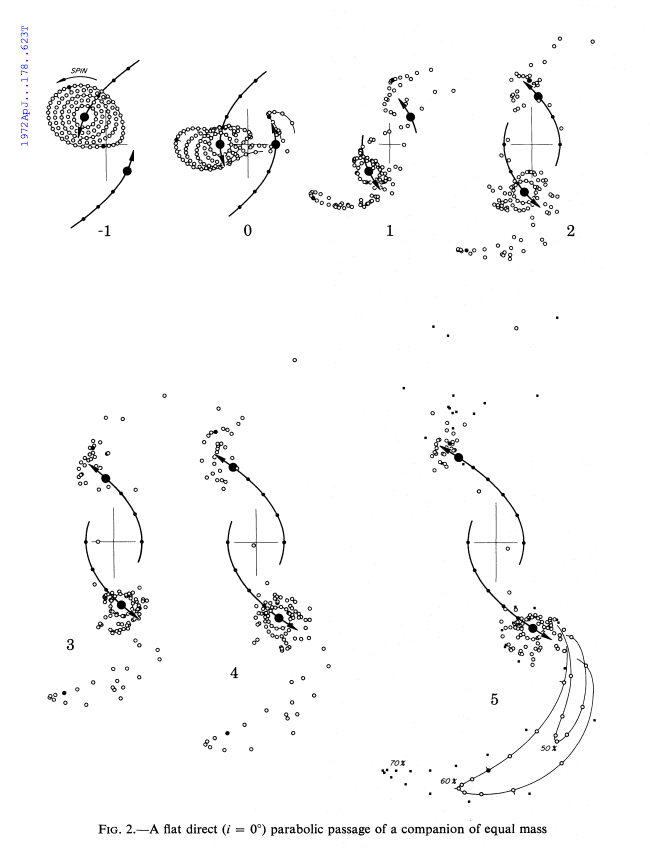

In [35]:
Image(filename='direct_passage_Toomre.png')

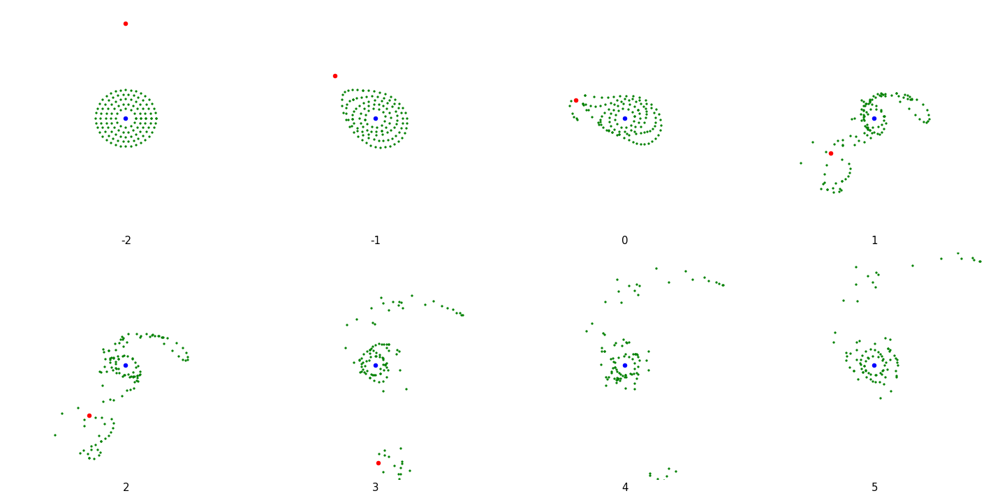

In [36]:
time2 = np.array([[0, 64, 85, 128], [142, 203, 242, 273]])
rx1, ry1, sx1, sy1 = get_sol_direct(rS, t, M, S, N)

sub_direct(rx1, ry1, sx1, sy1, time2)

In [37]:
m1 = mpy.VideoFileClip('base_direct.mp4')
m1.ipython_display(fps=24)

##Passage Around they System's Center of Mass

To show the system moving around the center of mass of the system, the following transformations need to be applied:

#####Center of Mass
$$CM = \frac{S*R}{M+S}$$

Using geometry and vector addition you get:

$$Radius\:of\:M$$ 

$$RM = -\frac{S*R}{M+S}$$

$$Radius\:of\:S$$ 

$$RS = rS - \frac{S*R}{M+S}$$

$$Radius\:of\:stars$$ 

$$rm = r - \frac{S*R}{M+S}$$

where:
* $S$ and $M$ are the respective mass of the galactic centers
* $R$ is the radius between $S$ and $M$
* $rS$ is the min radius of $S$
* $r$ is the radius of a star

In [38]:
def plot_pos_cm(rx, ry, sx, sy, M, S,  j=0):
    """Plots the solved positions of the system around they center of mass at any time
    
    Parameters
    ----------
    rx: array, x postitions of all stars
    ry: array, y postitions of all stars
    sx: array, x postitions of S
    sy: array, y postitions of S
    M,S: float, respective mass of the galactic centers
    j: float, time at which you are plotting
    
    Returns
    -------
    Scatter plot of the system around the center of mass at any given time.
    """
    plt.figure(figsize=(6,6))
    
    plt.scatter(0,0,color= 'k', label= 'CM', marker = "+", s= 100)
    plt.scatter((sx[j]-((M*sx[j])/(M+S))), (sy[j]-((M*sy[j])/(M+S))), color = 'b', label = 'S')
    plt.scatter((rx[j]-((S*sx[j])/(M+S))), (ry[j]-((S*sy[j])/(M+S))), color = 'g', marker = "*", label = 'stars', s=6)
    plt.scatter((-(M*sx[j])/(M+S)),(-(M*sy[j])/(M+S)), color = 'c', label = "M")
        
    plt.legend(loc='upper left')
    plt.xlim(-65,65)
    plt.ylim(-65,65)
    plt.box(False)
    plt.tick_params(axis = 'x', top = 'off', bottom = "off", labelbottom= 'off')
    plt.tick_params(axis = 'y', right = 'off', left= "off", labelleft= 'off')
    plt.show()

###Retrograde Passage

In [39]:
m2 = mpy.VideoFileClip('Q2_retro.mp4')
m2.ipython_display(fps=24)

###Direct Passage

In [40]:
m3 = mpy.VideoFileClip('Q2_direct.mp4')
m3.ipython_display(fps=24)

###Passage around Center of Mass with stars around both Galactic Centers

For this challenge I had to create functions that computed the intitial conditions of the stars with respect to S. Because our differential equation uses $\rho$ as the distance from stars to $S$, I can use $\rho$ to calculate the velocites of the stars around $S$. The system is solved however in the rest frame of $M$ so I must then transform $\rho$ to $r$ to be able to solve and plot the system. The equations I used are shown below:

$$v = \sqrt{\frac{GS}{\rho}} +vS$$

$$r = RS - \rho$$

The initial condition functions are set up exactly the same as the previously shown initial condition functions but with these equations for r and v.

###Solving the system

I had to add a loop in my solve system function to solve the system for the additional stars around $S$. All the following simulations are solved with slight variations of this function to allow for changes in the initial condions of the Direction in which the galaxies are passing eachother.

In [41]:
def sol_morestar_retro(rS, t, M, S, N):
    """Solves the system for N number of stars in inner layer
    
    Parameters
    ----------
    rS: float, initial radius of S
    t: array, array of times
    M: float, mass of M
    S: float, mass of S
    N: int, number of stars wanted in inner layer,
        each consecutive layer will have 6 additional stars
    
    Returns
    -------
    Returns the solutions postitions for each star and S at all times
    """
    G = 4.498e-6

    sx,svx,sy,svy = S_cond(rS,50, M, S)

    radi = np.array([0.2*rS, 0.3*rS, 0.4*rS,0.5*rS,0.6*rS])

    star_sols = []
    
    k=N+1
    for r in radi:
        c = star_cond(k,M,r)
        for i in range(k):
            ic = c[i]
            ic = np.append(ic, np.array([sx, svx, sy, svy]))
            sol = solve_system(ic, t, M, S)

            x = sol[:,0]
            y = sol[:,2]
            X = sol[:,4]
            Y = sol[:,6]
            star_sols.append(x)
            star_sols.append(y)
        k+=6
    
    l=N+1
    for r in radi:
        c = S_star_cond_neg(l, S, sx, sy, r, svx, svy)
        for i in range(l):
            ic = c[i]
            ic = np.append(ic, np.array([sx, svx, sy, svy]))
            sol = solve_system(ic, t, M, S)

            x = sol[:,0]
            y = sol[:,2]
            X = sol[:,4]
            Y = sol[:,6]
            star_sols.append(x)
            star_sols.append(y)
        l+=6
    
    all_stars = np.transpose(np.vstack(star_sols))
    starx = all_stars[:,0::2]
    stary = all_stars[:,1::2]
        
    return starx, stary, X, Y

###Retrograde/Retrograde Passage

In [42]:
m4 = mpy.VideoFileClip('Q3_retro.mp4')
m4.ipython_display(fps=24)

###Direct/Retrograde Passage

In [3]:
m5 = mpy.VideoFileClip('Q3_both.mp4')
m5.ipython_display(fps=24)

|#####-----| 213/401  53% [elapsed: 00:00 left: 00:00, 423.82 iters/sec]

  UserWarning)



###Direct/Direct Passage

In [44]:
m6 = mpy.VideoFileClip('Q3_direct.mp4')
m6.ipython_display(fps=24)

##$$Questions?$$